In [1]:
import pandas as pd
import numpy as np

from plotting import CandlePlot

In [2]:
def synchronize_dataframes(df_par1, df_par2):
    """
    Sincroniza os DataFrames pelo Timestamp.
    Retorna um DataFrame único contendo os preços de fechamento dos dois pares.
    """
    df = pd.merge(df_par1[['Time', 'Close']], 
                  df_par2[['Time', 'Close']], 
                  on='Time', 
                  suffixes=('_Par1', '_Par2'))
    df['Spread'] = df['Close_Par1'] - df['Close_Par2']
    return df



In [3]:
def calculate_returns_log(df, col_name):
    """
    Calcula o retorno logarítmico de uma série de preços.
    :param df: DataFrame contendo os dados.
    :param col_name: Nome da coluna de preços.
    :return: Série de retornos logarítmicos.
    """
    returns = np.log(df[col_name] / df[col_name].shift(1))
    return (1 + returns).cumprod() - 1


In [4]:
def synchronize_dataframes_with_returns(df_par1, df_par2):
    """
    Sincroniza os DataFrames pelo Timestamp e calcula os retornos logarítmicos.
    :param df_par1: DataFrame do Par 1.
    :param df_par2: DataFrame do Par 2.
    :return: DataFrame único com os retornos sincronizados.
    """
    # Sincronizar os preços
    df = pd.merge(df_par1[['Time', 'Close']], 
                  df_par2[['Time', 'Close']], 
                  on='Time', 
                  suffixes=('_Par1', '_Par2'))
    
    # Calcular os retornos
    df['Return_Par1'] = calculate_returns_log(df, 'Close_Par1')
    df['Return_Par2'] = calculate_returns_log(df, 'Close_Par2')
    
    # Calcular o spread dos retornos
    df['Spread'] = df['Return_Par1'] - df['Return_Par2']
    return df


In [5]:
def calculate_returns(df, col_name):
    """
    Calcula o retorno normal e logarítmico de uma série de preços.
    :param df: DataFrame contendo os dados.
    :param col_name: Nome da coluna de preços.
    :return: DataFrame com colunas de retorno normal e logarítmico.
    """
    df['Return_Normal'] = df[col_name].pct_change()
    df['Return_Log'] = np.log(df[col_name] / df[col_name].shift(1))
    return df


In [6]:
def calculate_cumulative_returns(df, col_name):
    """
    Calcula o retorno percentual acumulado de uma série de retornos.
    :param df: DataFrame contendo os dados.
    :param col_name: Nome da coluna de retornos (normal ou log).
    :return: Série com o retorno acumulado.
    """
    return (1 + df[col_name]).cumprod() - 1


In [7]:
# Exemplo de uso
# df_par1 e df_par2 devem conter colunas 'Time' (string) e 'Close' (float)
# df_par1 = pd.read_csv("par1.csv")
# df_par2 = pd.read_csv("par2.csv")

granularity = '1m'
pair1 = 'VIDTUSDT'
pair2 = 'TRXUSDT'

df_par1 = pd.read_pickle(f"crypto/{pair1}_{granularity}.pkl")
df_par2 = pd.read_pickle(f"crypto/{pair2}_{granularity}.pkl")

In [8]:
df_with_returns = synchronize_dataframes_with_returns(df_par1, df_par2)


In [9]:

# Exemplo de uso
df_sync = synchronize_dataframes(df_par1, df_par2)

In [10]:
df_sync.tail()

,Time,Close_Par1,Close_Par2,Spread
964716,2024-10-31 23:56:00,0.02611,0.1683,-0.14219
964717,2024-10-31 23:57:00,0.02611,0.1683,-0.14219
964718,2024-10-31 23:58:00,0.02613,0.1684,-0.14227
964719,2024-10-31 23:59:00,0.02611,0.1684,-0.14229
964720,2024-11-01 00:00:00,0.02606,0.1683,-0.14224


In [11]:
df_with_returns.tail()

,Time,Close_Par1,Close_Par2,Return_Par1,Return_Par2,Spread
964716,2024-10-31 23:56:00,0.02611,0.1683,-0.817075,1.706522,-2.523597
964717,2024-10-31 23:57:00,0.02611,0.1683,-0.817075,1.706522,-2.523597
964718,2024-10-31 23:58:00,0.02613,0.1684,-0.816935,1.708130,-2.525065
964719,2024-10-31 23:59:00,0.02611,0.1684,-0.817075,1.708130,-2.525205
964720,2024-11-01 00:00:00,0.02606,0.1683,-0.817426,1.706521,-2.523947


In [39]:
def calculate_zscore_log(df, window=50):
    """
    Calcula o Z-Score do spread dos retornos usando uma janela móvel.
    :param df: DataFrame com a coluna 'Spread'.
    :param window: Tamanho da janela para calcular a média e o desvio padrão.
    :return: DataFrame atualizado com a coluna 'Z-Score'.
    """
    df['Spread_Mean'] = df['Spread'].rolling(window=window).mean()
    df['Spread_Std'] = df['Spread'].rolling(window=window).std()
    df['Z-Score'] = (df['Spread'] - df['Spread_Mean']) / df['Spread_Std']
    return df


In [40]:
def calculate_zscore(df, window=50):
    """
    Calcula o Z-Score do spread usando uma janela móvel.
    :param df: DataFrame com a coluna 'Spread'.
    :param window: Tamanho da janela para calcular a média e o desvio padrão.
    :return: DataFrame atualizado com a coluna 'Z-Score'.
    """
    df['Spread_Mean'] = df['Spread'].rolling(window=window).mean()
    df['Spread_Std'] = df['Spread'].rolling(window=window).std()
    df['Z-Score'] = (df['Spread'] - df['Spread_Mean']) / df['Spread_Std']
    return df



In [41]:
# Exemplo de uso
df_with_zscore = calculate_zscore(df_sync, window=50)
df_with_zscore_log = calculate_zscore_log(df_with_returns, window=50)


In [42]:
df_with_zscore.tail()

,Time,Close_Par1,Close_Par2,Spread,Spread_Mean,Spread_Std,Z-Score
964716,2024-10-31 23:56:00,0.02611,0.1683,-0.14219,-0.142173,0.000107,-0.159013
964717,2024-10-31 23:57:00,0.02611,0.1683,-0.14219,-0.142177,0.000104,-0.125467
964718,2024-10-31 23:58:00,0.02613,0.1684,-0.14227,-0.142183,0.000099,-0.873953
964719,2024-10-31 23:59:00,0.02611,0.1684,-0.14229,-0.142188,0.000098,-1.035544
964720,2024-11-01 00:00:00,0.02606,0.1683,-0.14224,-0.142193,0.000096,-0.496296


In [43]:
df_with_zscore_log.tail()

,Time,Close_Par1,Close_Par2,Return_Par1,Return_Par2,Spread,Spread_Mean,Spread_Std,Z-Score
964716,2024-10-31 23:56:00,0.02611,0.1683,-0.817075,1.706522,-2.523597,-2.524445,0.001525,0.556141
964717,2024-10-31 23:57:00,0.02611,0.1683,-0.817075,1.706522,-2.523597,-2.524491,0.001461,0.611783
964718,2024-10-31 23:58:00,0.02613,0.1684,-0.816935,1.708130,-2.525065,-2.524572,0.001375,-0.358388
964719,2024-10-31 23:59:00,0.02611,0.1684,-0.817075,1.708130,-2.525205,-2.524624,0.001348,-0.431112
964720,2024-11-01 00:00:00,0.02606,0.1683,-0.817426,1.706521,-2.523947,-2.524655,0.001314,0.538417


In [44]:
# def generate_signals(df, entry_threshold=2, exit_threshold=0):
#     """
#     Gera sinais de entrada e saída com base no Z-Score.
#     :param df: DataFrame com a coluna 'Z-Score'.
#     :param entry_threshold: Limiar para entrada (ex.: ±2).
#     :param exit_threshold: Limiar para saída (ex.: 0).
#     :return: DataFrame atualizado com sinais ('Signal' column).
#     """
#     df['Signal'] = 0
#     # Sinal de entrada (Z > entry_threshold ou Z < -entry_threshold)
#     df.loc[df['Z-Score'] > entry_threshold, 'Signal'] = -1  # Short Par1, Long Par2
#     df.loc[df['Z-Score'] < -entry_threshold, 'Signal'] = 1  # Long Par1, Short Par2
#     # Sinal de saída (Z próximo de zero)
#     df.loc[(df['Z-Score'] > -exit_threshold) & (df['Z-Score'] < exit_threshold), 'Signal'] = 0
#     return df



In [45]:
# # Exemplo de uso
# df_with_signals = generate_signals(df_with_zscore, entry_threshold=2, exit_threshold=0)
# df_with_signals.head(50)

In [46]:
def scale_prices(df, col_name):
    """
    Escala uma coluna para que os valores comecem do mesmo ponto inicial.
    :param df: DataFrame contendo os dados.
    :param col_name: Nome da coluna a ser escalada.
    :return: Série escalada.
    """
    return df[col_name] / df[col_name].iloc[0]


# Escalar os preços
df_sync['Close_Par1_Scaled'] = scale_prices(df_sync, 'Close_Par1')
df_sync['Close_Par2_Scaled'] = scale_prices(df_sync, 'Close_Par2')



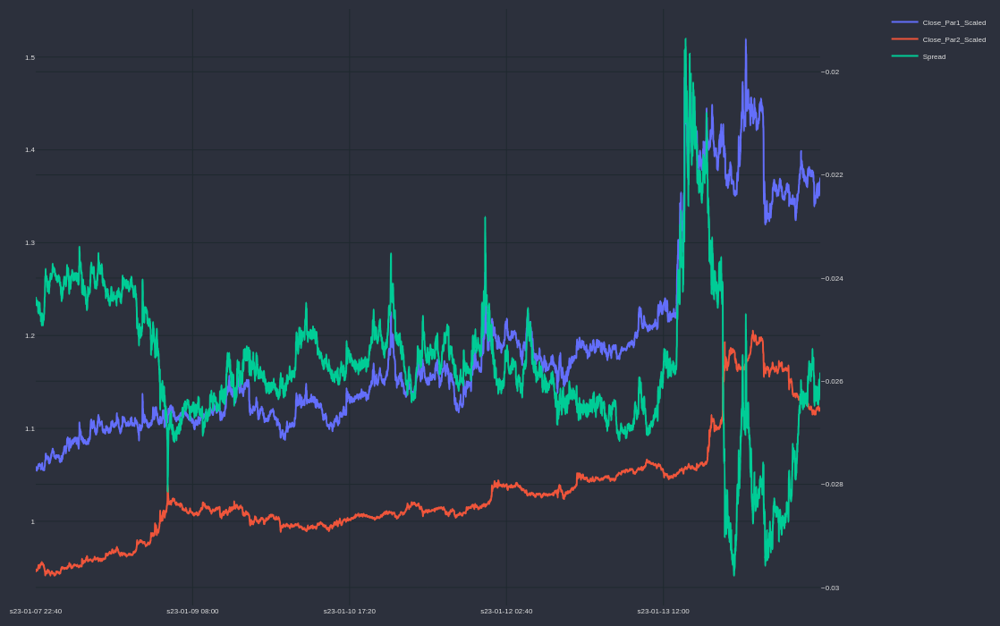

In [47]:
df_with_zscore['time'] = df_with_zscore['Time'].copy()
cp = CandlePlot(df_with_zscore.iloc[10000:20000], candles=False)
cp.add_traces(['Close_Par1_Scaled','Close_Par2_Scaled'])
cp.show_plot(height=700, width=1100, sec_traces=['Spread'])

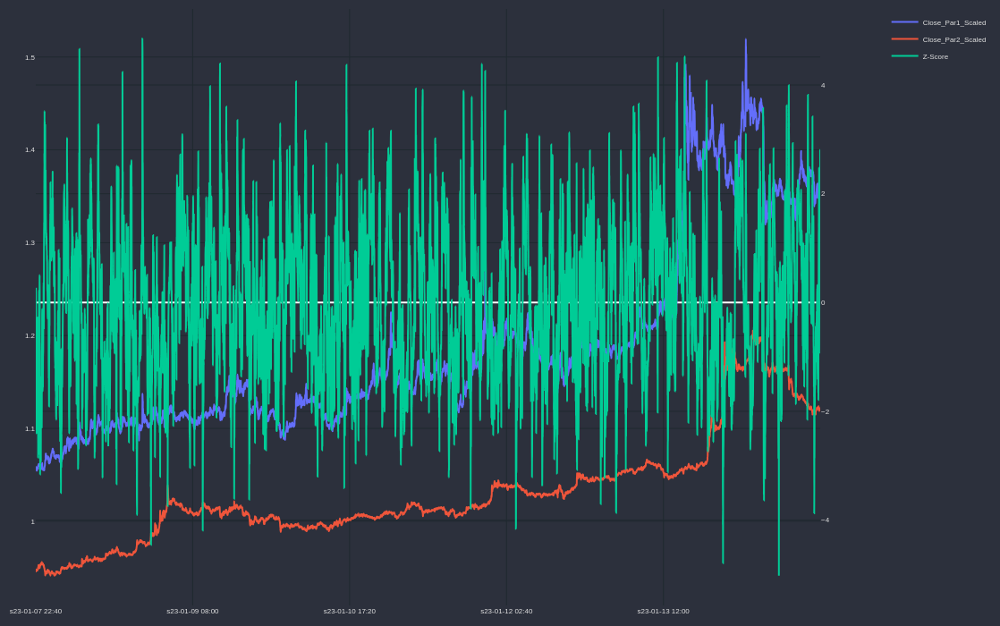

In [48]:
df_with_zscore['time'] = df_with_zscore['Time'].copy()
cp = CandlePlot(df_with_zscore.iloc[10000:20000], candles=False)
cp.add_traces(['Close_Par1_Scaled','Close_Par2_Scaled'])
cp.show_plot(height=700, width=1100, sec_traces=['Z-Score'])

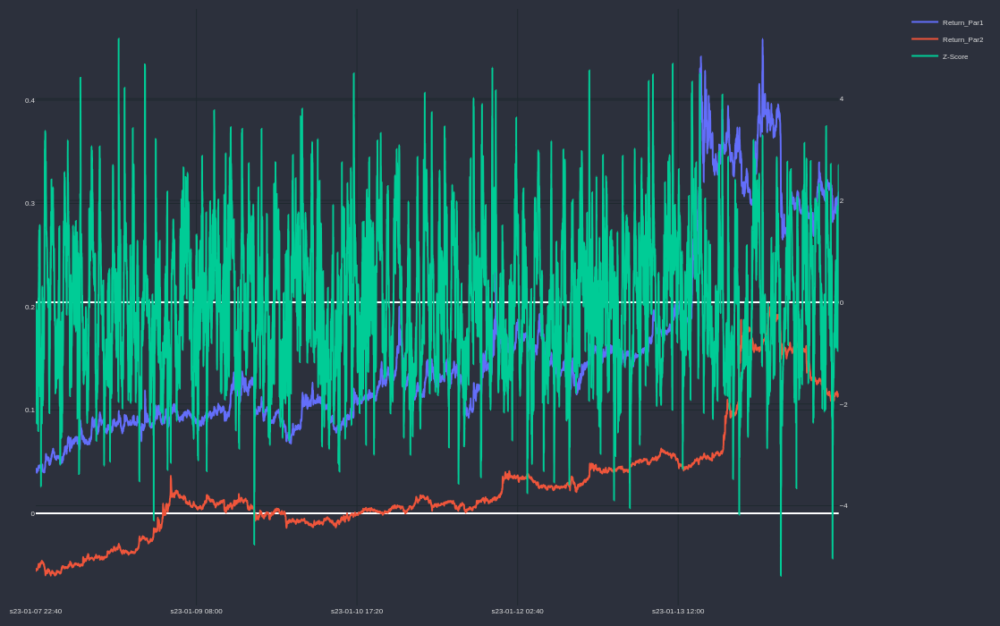

In [49]:
df_with_zscore_log['time'] = df_with_zscore_log['Time'].copy()
cp = CandlePlot(df_with_zscore_log.iloc[10000:20000], candles=False)
cp.add_traces(['Return_Par1','Return_Par2'])
cp.show_plot(height=700, width=1100, sec_traces=['Z-Score'])